(nn/01-intro)=
# Introduction

![Status](https://img.shields.io/static/v1.svg?label=Status&message=Finished&color=brightgreen)
[![Source](https://img.shields.io/static/v1.svg?label=GitHub&message=Source&color=181717&logo=GitHub)](https://github.com/particle1331/ok-transformer/blob/master/docs/nb/dl/01-intro.ipynb)
[![Stars](https://img.shields.io/github/stars/particle1331/ok-transformer?style=social)](https://github.com/particle1331/ok-transformer)

---

**Readings:** [[CS182-lec1]](https://cs182sp21.github.io/static/slides/lec-1.pdf) [[CS182-lec2]](https://cs182sp21.github.io/static/slides/lec-2.pdf) [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf) [[CS4780-lec12]](https://www.cs.cornell.edu/courses/cs4780/2018sp/lectures/lecturenote12.html)

## Introduction

Recall that machine learning involves finding parameters of a model that optimizes some metric. 
Deep learning can be thought of as machine learning with multiple **layers** of **learned representations**. 
Here a layer is any parametric transformation, and we will call any function that consist of multiple layers 
a **neural network**.
Representations are powerful: in machine translation, phrases are not translated 1-1 between 
words in two languages, instead an intermediate representation is learned between translated phrases ({numref}`01-thought`). 

```{figure} ../../img/nn/01-thought.png
---
name: 01-thought
width: 80%
---
Thought is a representation.
```

The practical success of deep learning can be further attributed to three factors:
* **complexity**: big models, many layers
* **data**: large datasets containing many examples
* **compute**: large compute (GPUs)

Are more layers better? Generally, yes ({numref}`01-imagenet-progress`). Higher level features are more abstract and invariant to noise which makes it easier to learn labels. 
This requires large models with many layers.
This also requires large datasets with many examples of all different scenarios. This is necessary for complexity of distributions that it tries to learn. Both these requirements necessitate large compute ({numref}`01-gflops`).

```{figure} ../../img/nn/01-imagenet-progress.png
---
name: 01-imagenet-progress
width: 80%
---
Progress in top-5 error in the [ImageNet competition](https://en.wikipedia.org/wiki/ImageNet#ImageNet_Challenge).
```

```{figure} ../../img/nn/01-gflops.png
---
name: 01-gflops
width: 80%
---
ResNets are in the middle of the graph. GFlops are a good metric since a network can have large compute with small number of parameters (e.g. convolutions).
```

DL is resource intensive, so it is natural to ask whether it is a good idea.
The tradeoff is that DL models have very **high capacity** 
and are immediately **scalable** 
that as we add more layers, more data, and more compute, the 
models just get better and better. Moreover,
DL models acquire representations end-to-end purely from the data without requiring 
manual engineering of features or representations. 
Such representations are better tailored to the
current task and minimizes **inductive bias**. 
Indeed, DL has been able to beat several human
benchmark on specific tasks tasks {cite}`mnih2015human` {cite}`bert`.

**Remark.** Model capacity refers to how many 
different functions a particular model class can represent. Roughly if model capacity 
is sufficiently large, its function space contains the true function that underlies the 
task. 
Model capacity can be controlled by parameter count in certain architectures.
Inductive bias refers to built-in knowledge or biases in a model
designed to help it learn. All such knowledge is "bias" in the sense that
it makes some solutions more likely and some less likely. Scaling is the ability for an 
algorithm to work better as data and model capacity is increased.

## Fully-connected networks

**Fully-connected networks** consist of **dense** layers followed by an [activation function](https://en.wikipedia.org/wiki/Activation_function):
$y_k = \varphi(\boldsymbol{\mathsf{x}} \cdot \boldsymbol{\mathsf{w}}_k + b_k)$ for $k = 1, \ldots, h$ where the activation $\varphi\colon \mathbb{R} \to \mathbb{R}$ is a nonlinear function. The number of outputs $h$ is called the **width** of the layer. This can be written in terms of matrix multiplication: $\boldsymbol{\mathsf{y}} = \varphi\left(\boldsymbol{\mathsf{x}}\boldsymbol{\mathsf{W}} + \boldsymbol{\mathsf{b}}\right)$ where we stack $B$ data points in $\mathbb{R}^d$ so that the input $\boldsymbol{\mathsf{x}}$ has shape $(B, d).$ This allows the network to process data in parallel. Note that the layer output $\boldsymbol{\mathsf{y}}$ can be passed to another layer. The number of layers in a network is called its **depth**.

```{margin}
[Universal approximation](https://en.wikipedia.org/wiki/Universal_approximation_theorem)
```

It turns out that fully-connected neural networks can approximate any continuous function $f$ from a closed and bounded set $K \subset \mathbb{R}^d$ to $\mathbb{R}^m.$ This is a reasonable assumption about a ground truth function which we assume to exist.  The following approximates a one-dimensional curve using a neural network with [ReLU activation](https://en.wikipedia.org/wiki/Rectifier_(neural_networks)): $z \mapsto \max(0, z)$ for $z \in \mathbb{R}.$

In [18]:
import torch

# Ground truth
x = torch.linspace(-2*torch.pi, 2*torch.pi, 1000)
y = torch.sin(x) + 0.3 * x

# Get (sorted) sample
B = torch.randint(0, 1000, size=(24,))
B = torch.sort(B)[0]
xs = x[B]
ys = y[B]

# ReLU approximation
z = torch.zeros(1000,)
for i in range(len(xs) - 1):
    if torch.isclose(xs[i + 1], xs[i]):
        m = torch.tensor(0.0)
    else:
        M = (ys[i+1] - ys[i]) / (xs[i+1] - xs[i])
        s, m = torch.sign(M), torch.abs(M)
    z += s * (torch.relu(m * (x - xs[i])) - torch.relu(m * (x - xs[i+1])))
z += ys[0]

Note this only works (consistent with the theorem) for target function with domain `[a, b]`.

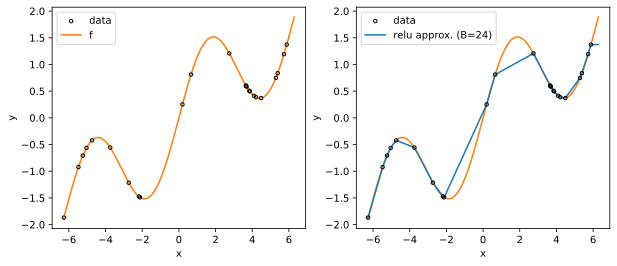

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_inline import backend_inline
backend_inline.set_matplotlib_formats('svg')

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].scatter(xs, ys, facecolor='none', s=12, edgecolor='k', zorder=3, label='data')
ax[0].plot(x, y, color="C1", label='f')
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')
ax[0].legend();

ax[1].scatter(xs, ys, facecolor='none', s=12, edgecolor='k', zorder=4, label='data')
ax[1].plot(x, z, color="C0", label=f'relu approx. (B={len(B)})', zorder=3)
ax[1].plot(x, y, color="C1")
ax[1].set_xlabel('x')
ax[1].set_ylabel('y')
ax[1].legend();

This works by constructing `___/‾‾‾` and `‾‾‾\___` functions similar to step functions but with slope in between adjacent points. The step functions increment each other starting with the constant function `ys[0]`. Note this correctly ends with a constant function `ys[-1]`.

## Linear classification

Neural networks learn separating hyperplanes after a sequence of transformations (layers) on the input data for classification tasks. The intermediate outputs of the layers are what we call representations. The distances of a data point to these hyperplanes are used as class scores or **logits**. Note that instead of labels, we want to predict probabilities since these can be perturbed. Note that we can apply any positive function $f$ to class scores to convert it to a probability vector:

$$p_j = \frac{f(s_j)}{\sum_k f(s_k)}.$$

A good choice for $f$ is the exponential function which maps $\mathbb R$ to $\mathbb R^+$ one-to-one. The resulting function is called the **softmax function**:

$$\text{softmax}(\boldsymbol{\mathsf{s}})_j = p_j = \frac{e^{s_j}}{\sum_k e^{s_k}}.$$

**Remark.** Notice that for binary classification we recover the **sigmoid**: $p_1 = {1}/\left(1 + e^{-(s_1 - s_0)}\right).$ This is [logistic regression](https://en.wikipedia.org/wiki/Logistic_regression) if we are using a single layer neural network with $s_k = \boldsymbol{\mathsf{w}}_k \cdot \boldsymbol{\mathsf{x}} + b_k$ so that $s_1 - s_0 = (\boldsymbol{\mathsf{w}}_1 - \boldsymbol{\mathsf{w}}_0) \cdot \boldsymbol{\mathsf{x}} + (b_1 - b_0)$. Since we learn a weight vector for each class, there are generally as many separating hyperplanes as the number of classes. For binary classification with softmax, the two vectors subtract out resulting in one separating plane.

In [20]:
s = np.linspace(-10, 10, 300)
p = 1 / (1 + np.exp(-s))

inv = lambda p: np.log(p / (1 - p))
threshold = 0.15
s_low  = inv(threshold)
s_high = inv(1 - threshold)

x0 = [-8.0, -7.8, -6.5, -5.0, -2.5, -1.25, 0.3, -7.6]
x1 = [-2.2,  0.0,  6.0,  1.3,  5.0,   7.5, 7.6,  8.3]

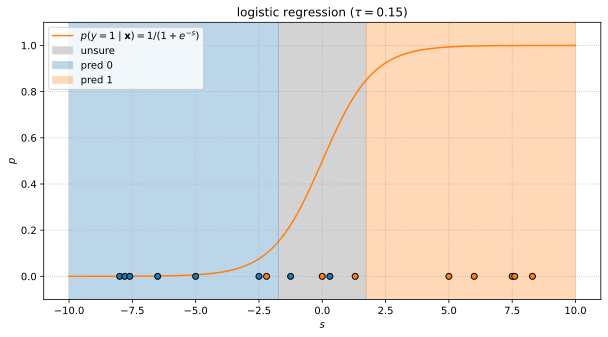

In [21]:
plt.figure(figsize=(10, 5))
plt.title(r"logistic regression ($\tau = 0.15$)")
plt.plot(s, p, label="$p(y=1 \mid {\mathbf{x}}) = 1 / (1 + e^{-s})$", color="C1")
for i in range(len(x0)):
    plt.scatter(x0[i], 0.0, color="C0", zorder=3, edgecolor='k')
    plt.scatter(x1[i], 0.0, color="C1", zorder=3, edgecolor='k')

plt.axvspan(s_low, s_high, -2.0, 2.0, color='lightgray', label="unsure")
plt.axvspan(-10.0, s_low,  -2.0, 2.0, color='C0', label="pred 0", alpha=0.3)
plt.axvspan(s_high, 10.0,  -2.0, 2.0, color='C1', label="pred 1", alpha=0.3)
plt.xlabel("$s$")
plt.ylabel("$p$")
plt.legend()
plt.ylim(-0.1, 1.1)
plt.grid(linestyle="dotted");

Note that the sigmoid assigns $p =\frac{1}{2}$ at the hyperplane where $s = 0.$ It scales symmetrically with respect to the distance of the data points from the decision boundary. This is nice otherwise the prediction will not be invariant with respect to relabeling. For the general case of multiclass classification, we will have class scores $s_k = \boldsymbol{\mathsf{w}}_k \cdot \boldsymbol{\mathsf{x}}$ and the softmax will act like a **voting function**. See [this video](https://www.youtube.com/watch?v=p-6wUOXaVqs) for deeper reasons on using the softmax function.

In [22]:
# grid of points
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)

# parameters
w = [1, 1]
b = 0

def sigmoid_neuron(x, y):
    z = w[0] * x + w[1] * y + b
    return 1 / (1 + np.exp(-z))

def relu_neuron(x, y):
    z = w[0] * x + w[1] * y + b
    return np.maximum(0, z)

The sigmoid unit assigns a gradient along the normal of the hyperplane defined by $\boldsymbol{\mathsf{w}}$ and $b$ in the input space $\mathbb{R}^2$. This effectively reduces the input
space to one dimension along the direction of ${\boldsymbol{\mathsf{w}}} = [1, 1].$ Here $H$ is the linear decision boundary defined by points $\boldsymbol{\mathsf{x}}$ such that $\boldsymbol{\mathsf{x}} \cdot \boldsymbol{\mathsf{w}} + b = 0.$ ReLU unit has sharp cutoff at zero.

In [23]:
from matplotlib.colors import LinearSegmentedColormap

colors = ["C0", "C1"]
n_bins = 100
cm = LinearSegmentedColormap.from_list(name="", colors=colors, N=n_bins)

def plot_grid(ax, X, Y, Z):
    p1 = (-0.45, -0.45)
    p2 = (1, 1)
    ax.annotate(f'$\mathsf{{w}}$', xy=p2, xytext=p1, arrowprops=dict(arrowstyle='->'))
    ax.plot(x, -x, color='k', linewidth=1, linestyle='dotted', label='H')

    im = ax.pcolormesh(X, Y, Z, shading='auto', cmap=cm)
    cbar = plt.colorbar(im, ax=ax)
    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')
    ax.legend()


Z0 = sigmoid_neuron(X, Y)
Z1 = relu_neuron(X, Y)

fig, ax = plt.subplots(1, 2, figsize=(11, 4))
plot_grid(ax[0], X, Y, Z0)
plot_grid(ax[1], X, Y, Z1)

This is the immediate representation that gets passed to the next layer. The next layer can then take a weighted combination of these surfaces to construct a complex leveling of the input space. Another way to think about this is that a weight vector $\boldsymbol{\mathsf{w}}$ corresponds to a learned pattern, so that the projection $\boldsymbol{\mathsf{x}} \cdot \boldsymbol{\mathsf{w}}$ of the input $\boldsymbol{\mathsf{x}}$ to $\boldsymbol{\mathsf{w}}$ corresponds to a scaled similarity. The activation function determines whether this plus the bias $b$ is enough to activate the unit.

### Negative log loss (MLE)

The machine learning method follows four steps: defining a model, defining a loss function,
choosing an optimizer, and running it on large compute (e.g. GPUs). A **loss function** 
acts a smooth surrogate to the true objective which may not be amenable to available optimization 
techniques. Hence, we can think of loss functions as a measure of model quality.
The choice of loss function determines what the model parameters will optimize towards.

Here we derive a loss function based on [maximum likelihood estimation](https://en.wikipedia.org/wiki/Maximum_likelihood_estimation#:~:text=In%20statistics%2C%20maximum%20likelihood%20estimation,observed%20data%20is%20most%20probable) (MLE). This results in finding optimal parameters such that the dataset is more probable.
The [likelihood](https://mathworld.wolfram.com/Likelihood.html) of the [IID](https://en.wikipedia.org/wiki/Independent_and_identically_distributed_random_variables) sample $\mathcal{D} = \{(\boldsymbol{\mathsf{x}}_i, y_i)\}$ assigned by the model with parameters $\boldsymbol{\Theta}$ is

$$
\begin{aligned}
p(\mathcal{D} \mid \boldsymbol{\Theta}) 
= \prod_i \frac{p(\boldsymbol{\mathsf{x}}_i, y_i, \boldsymbol{\Theta})}{p(\boldsymbol{\Theta})} 
&= \prod_i \frac{p(\boldsymbol{\mathsf{x}}_i, y_i, \boldsymbol{\Theta})}{p(\boldsymbol{\mathsf{x}}_i)\,p(\boldsymbol{\Theta}) }\,p(\boldsymbol{\mathsf{x}}_i) \\
&= \prod_i \frac{p(y_i, \boldsymbol{\mathsf{x}}_i, \boldsymbol{\Theta})}{p(\boldsymbol{\mathsf{x}}_i, \boldsymbol{\Theta})}\,p(\boldsymbol{\mathsf{x}}_i) \\
&= \prod_i p_{\boldsymbol{\Theta}}(y_i \mid \boldsymbol{\mathsf{x}}_i) \,p(\boldsymbol{\mathsf{x}}_i).
\end{aligned}
$$

where $p_{\boldsymbol{\Theta}}(y_i \mid \boldsymbol{\mathsf{x}}_i) = p(y_i \mid \boldsymbol{\mathsf{x}}_i, {\boldsymbol{\Theta}})$
is the model's estimate of the probability of the label $y_i$ of an input $\boldsymbol{\mathsf{x}}_i$. 
Probabilities are
small numbers in $[0, 1]$ and we are multiplying lots of them. So we apply the logarithm which is monotonic
and converts the product into a sum:

$$
\begin{aligned}
\log p(\mathcal{D} \mid \boldsymbol{\Theta}) 
&= \sum_i \log p_{\boldsymbol{\Theta}}(y_i \mid \boldsymbol{\mathsf{x}}_i) + \sum_i \log p(\boldsymbol{\mathsf{x}}_i)
\end{aligned}
$$

MLE maximizes the log-likelihood with respect to the parameters $\boldsymbol{\Theta}.$ Common practice in optimization literature is to convert this to a minimization problem. Note that the second term is independent of the parameters. The following becomes our optimization problem:

$$\boldsymbol{\Theta}^* = \underset{\boldsymbol{\Theta}}{\text{argmin}}\,\left( -\sum_i \log p_{\boldsymbol{\Theta}}(y_i \mid \boldsymbol{\mathsf{x}}_i)\right).$$

This allows us to define $\ell = -\log p_{\boldsymbol{\Theta}}(y \mid \boldsymbol{\mathsf{x}}).$ In general, the loss function can be any nonnegative function whose value approaches zero whenever the prediction of the network the target value. Observe that:

- $p_{\boldsymbol{\Theta}}(y \mid \boldsymbol{\mathsf{x}}) \to 1$ $\implies$ $\ell \to 0$
- $p_{\boldsymbol{\Theta}}(y \mid \boldsymbol{\mathsf{x}}) \to 0$ $\implies$ $\ell \to \infty$ 

Using an expectation of the loss over the underlying distribution allows the model to focus on errors based on its probability of occuring. For parameters $\boldsymbol{\Theta},$ we will approximate the **true risk** which is the expectation of $\ell$ on the underlying distribution with the **empirical risk** calculated on the sample $\mathcal{D}$:

```{math}
:label: risk
\begin{aligned}
\mathcal{L}(\boldsymbol{\Theta}) 
&= \mathbb{E}_{\boldsymbol{\mathsf{x}},y}\left[\ell(y, f_{\boldsymbol{\Theta}}(\boldsymbol{\mathsf{x}}))\right] \\
&\approx \mathcal{L}_\mathcal{D}(\boldsymbol{\Theta}) = \frac{1}{|\mathcal{D}|} \sum_i \ell(y_i, f_{\boldsymbol{\Theta}}(\boldsymbol{\mathsf{x}}_i)).
\end{aligned}
```

The optimization problem can be written more generally as
$\boldsymbol{\Theta}^* = \underset{\boldsymbol{\Theta}}{\text{argmin}}\, \mathcal{L}_\mathcal{D}(\boldsymbol{\Theta})
$.

### Gradient descent

Now that we have the empirical risk $\mathcal{L}_\mathcal{D}(\boldsymbol{\Theta})$ {eq}`risk` as objective, we proceed to the actual optimization algorithm. Given the current parameters $\boldsymbol{\Theta} \in \mathbb R^M$ of the network, we can imagine the network to be sitting on a point $(\boldsymbol{\Theta}, \mathcal L_{\mathcal{D}}(\boldsymbol{\Theta}))$ on a surface in $\mathbb R^M \times \mathbb R.$ The surface will generally vary for different samples of the training data. Training is equivalent to finding the minimum of this surface. 
Gradients arise in deep learning when making the following first-order approximation:

$$\Delta \mathcal L_{\mathcal{D}} \approx  \sum_k \left(\frac{\partial \mathcal L_{\mathcal{D}}}{ \partial {\Theta}_k} \right)  \Delta {\Theta}_k = \left( \nabla_{\boldsymbol{\Theta}}\, \mathcal L_{\mathcal{D}} \right) \cdot \Delta {\boldsymbol{\Theta}}.$$ 

It follows that $-\nabla_{\boldsymbol{\Theta}}\, \mathcal L_{\mathcal{D}}$ is the direction of steepest descent at the current point $(\boldsymbol{\Theta}, \mathcal L_{\mathcal{D}})$ in the surface. **Gradient descent** (GD) is defined by the update rule: 

$$
\boldsymbol{\Theta}^{t+1} = \boldsymbol{\Theta}^t - \eta\; \nabla_{\boldsymbol{\Theta}}\, \mathcal L_{\mathcal{D}}(\boldsymbol{\Theta}^t)
$$

where the **learning rate** $\eta > 0$ controls the step size. Note that finding good **initial weights** $\boldsymbol{\Theta}^0 \in \mathbb{R}^M$ is crucial since networks has lots of internal symmetries and can diverge in the early stages of training. Later on we will see that other optimization algorithms in deep learning practice are just modifications of GD.

In [24]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # For 3D plotting
import numpy as np

def plot_surface(ax, data, target, N=50):
    x = np.linspace(-5, 5, N)
    y = np.linspace(-5, 5, N)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)
    for i in range(N):
        for j in range(N):
            Z[i, j] = loss(np.array([X[i, j], Y[i, j]]), data, target)
    
    ax.plot_surface(X, Y, Z, cmap='Reds')
    ax.set_xlabel(f'$w_0$')
    ax.set_ylabel(f'$w_1$')
    ax.set_title('loss surface')
    

def plot_contourf(ax, data, target, w_min, w_hist, title="", N=50):
    x = np.linspace(-5, 5, N)
    y = np.linspace(-5, 5, N)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)
    for i in range(N):
        for j in range(N):
            Z[i, j] = loss(np.array([X[i, j], Y[i, j]]), data, target)

    for t in range(1, len(w_hist)):
        ax.plot([w_hist[t-1][0], w_hist[t][0]], [w_hist[t-1][1], w_hist[t][1]], color='k')

    c = ax.contourf(X, Y, Z, levels=20, cmap='Reds')
    ax.scatter(w_min[0], w_min[1], color="red", label='min', zorder=3)
    ax.scatter(w_hist[:, 0], w_hist[:, 1], marker='o', s=5, facecolors='k')
    ax.set_title(title)
    ax.set_xlabel(f'$w_0$')
    ax.set_ylabel(f'$w_1$')
    plt.colorbar(c, ax=ax)

In [25]:
def loss(w, X, y):
    return ((X @ w - y)**2).mean()

def grad(w, X, y, B=None):
    """Gradient step for the MSE loss function"""
    dw = 2*((X @ w - y).reshape(-1, 1) * X).mean(axis=0)
    return dw / np.linalg.norm(dw)

def grad_descent(w0, X, y, eta=0.1, steps=10):
    """Return sequence of weights from GD."""
    w = np.zeros([steps, 2])
    w[0, :] = w0
    for j in range(1, steps):
        u = w[j-1, :]
        w[j, :] = u - eta * grad(u, X, y)
    return w


# Generate data
n = 1000
X = np.zeros((n, 2))
X[:, 1] = np.random.uniform(low=-1, high=1, size=n)
X[:, 0] = 1
w_min = np.array([-1, 3])
y = (X @ w_min) + 0.05 * np.random.randn(n)  # data: y = -1 + 3x + noise

# Gradient descent
w_init = [-4, -4]
w_step = grad_descent(w_init, X, y, eta=0.5, steps=25)

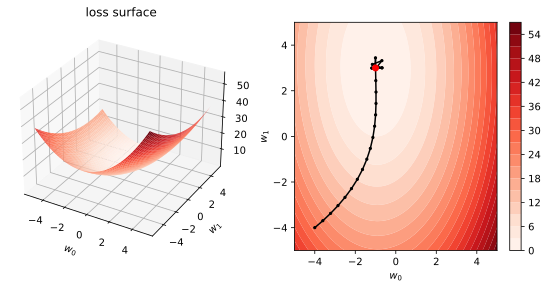

In [26]:
# Create a figure and two subplots
fig = plt.figure(figsize=(8, 4))
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122)

# Call the functions with the respective axes
plot_surface(ax1, X, y)
plot_contourf(ax2, X, y, w_min, w_step)
plt.tight_layout()
plt.show()

**Figure.** Loss surface (left) and gradient descent (right) of a linear function with MSE loss.

(01-nonlinear-decision-boundary)=
### Nonlinear decision boundary

Going back to classification. Let us generate data that is **not** linearly separable. 
In this section, we will show that linear classification extends to input data that is not linearly separable.
The idea is to apply a sequence of transformations on the input such that the final result becomes linearly separable.

In [27]:
import torch 
torch.manual_seed(2)

N = 1500  # sample size
noise = lambda e: torch.randn(N, 2) * e
t = 2 * torch.pi * torch.rand(N, 1)
s = 2 * torch.pi * torch.rand(N, 1)

x0 = torch.cat([0.1 * torch.cos(s), 0.1 * torch.sin(s)], dim=1) + noise(0.05)
x1 = torch.cat([1.0 * torch.cos(t), 1.0 * torch.sin(t)], dim=1) + noise(0.1)
y0 = (torch.ones(N,) * 0).long()
y1 = (torch.ones(N,) * 1).long()

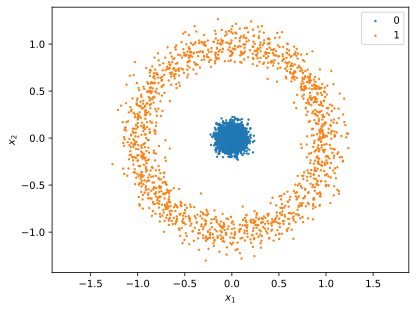

In [28]:
plt.scatter(x0[:, 0], x0[:, 1], s=2.0, label=0, color="C0")
plt.scatter(x1[:, 0], x1[:, 1], s=2.0, label=1, color="C1")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.legend()
plt.axis('equal');

Modeling this with a fully-connected neural network with one hidden layer containing units that uses the [tanh function](https://mathworld.wolfram.com/HyperbolicTangent.html) as activation: $\text{tanh}(z) = \frac{e^{z} - e^{-z}}{e^{z} + e^{-z}}.$
This maps $\mathbb{R}$ to $[-1, 1]$ symmetrically with $\text{tanh}(0) = 0$ and $\text{tanh}(z) \to \pm 1$ as $z \to \pm\infty.$ Note that tanh is actually just a scaled and translated version of the sigmoid function.

In [29]:
import torch.nn as nn
from torchsummary import summary

model = lambda: nn.Sequential(
    nn.Linear(2, 3), nn.Tanh(),
    nn.Linear(3, 2)
)

summary(model(), input_size=(2,))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                    [-1, 3]               9
              Tanh-2                    [-1, 3]               0
            Linear-3                    [-1, 2]               8
Total params: 17
Trainable params: 17
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------


Gradient descent on the [cross-entropy loss](https://en.wikipedia.org/wiki/Cross-entropy) (equivalent to NLL):

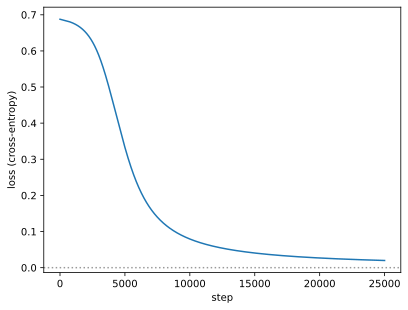

In [30]:
import torch.nn.functional as F

net = model()
loss_fn = lambda logits, y: F.cross_entropy(logits, y)
optim = torch.optim.SGD(net.parameters(), lr=0.01)

x = torch.cat([x0, x1])
y = torch.cat([y0, y1])
history = []
for step in range(25000):
    logits = net(x)
    loss = loss_fn(logits, y)
    loss.backward()
    optim.step()
    optim.zero_grad()
    history.append(loss.item())
    
plt.plot(history)
plt.axhline(0.0, linestyle="dotted", color="grey", alpha=0.8)
plt.xlabel("step")
plt.ylabel("loss (cross-entropy)");

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# transformations
linear_0 = net[0](x0).detach().numpy()
linear_1 = net[0](x1).detach().numpy()
linear_relu_0 = net[1](net[0](x0)).detach().numpy()
linear_relu_1 = net[1](net[0](x1)).detach().numpy()

# separating hyperplane (see above discussion, i.e. w <- w1 - w0  == logistic reg)
h = 1
w, b = net[2].parameters()
w, b = (w[h] - w[h-1]).detach().numpy(), (b[h] - b[h-1]).detach().numpy()

# plot
fig = plt.figure(figsize=(12, 4))
ax0 = fig.add_subplot(131)
ax1 = fig.add_subplot(132, projection='3d')
ax2 = fig.add_subplot(133, projection='3d')

ax0.grid(alpha=0.8)
ax0.set_axisbelow(True)
ax0.scatter(x0[:, 0], x0[:, 1], s=2.0, label=0, color="C0")
ax0.scatter(x1[:, 0], x1[:, 1], s=2.0, label=1, color="C1")
ax0.set_xlabel("$x_1$")
ax0.set_ylabel("$x_2$")
ax0.set_xlim(-1.5, 1.5)
ax0.set_ylim(-1.5, 1.5)
ax0.set_title("(a) input")
ax0.legend()
ax0.axis('equal')

ax1.scatter(linear_0[:, 0], linear_0[:, 1], linear_0[:, 2], s=3, label=0, color="C0")
ax1.scatter(linear_1[:, 0], linear_1[:, 1], linear_1[:, 2], s=3, label=1, color="C1")
ax1.set_xlabel('$x_1$')
ax1.set_ylabel('$x_2$')
ax1.set_zlabel('$x_3$')
ax1.set_title('(b) linear')

ax2.scatter(linear_relu_0[:, 0], linear_relu_0[:, 1], linear_relu_0[:, 2], s=3, label=0, color="C0")
ax2.scatter(linear_relu_1[:, 0], linear_relu_1[:, 1], linear_relu_1[:, 2], s=3, label=1, color="C1")
ax2.set_xlabel('$x_1$')
ax2.set_ylabel('$x_2$')
ax2.set_zlabel('$x_3$')
ax2.set_title('(c) linear + tanh')

# Generate grid of points
x_min = min(linear_relu_1[:, 0].min(), linear_relu_0[:, 0].min())
x_max = max(linear_relu_1[:, 0].max(), linear_relu_0[:, 0].max())
y_min = min(linear_relu_1[:, 1].min(), linear_relu_0[:, 1].min())
y_max = max(linear_relu_1[:, 1].max(), linear_relu_0[:, 1].max())
a, b, c, d = w[0], w[1], w[2], b
x = np.linspace(x_min, x_max, 50)
y = np.linspace(y_min, y_max, 50)
X, Y = np.meshgrid(x, y)
Z = (-a * X - b * Y - d) / c

# Plot the hyperplane for the positive class
ax2.plot_surface(X, Y, Z, alpha=0.5, color=f"C{h}")
fig.tight_layout();

Checking classification accuracy:

In [15]:
a = (torch.argmax(net(x0), dim=1) == y0).float().mean().item()
b = (torch.argmax(net(x1), dim=1) == y1).float().mean().item()
a, b

(1.0, 1.0)

Decision boundary in the input space. Note that we have to convert logits to probabilities:

In [16]:
def prediction(x, y):
    p = F.softmax(net(torch.tensor([[x, y]])), dim=1)
    return p[0, 1].item()

In [17]:
from matplotlib.colors import LinearSegmentedColormap

# Define your custom colormap
colors = ["C0", "C1"]
n_bins = 100
cm = LinearSegmentedColormap.from_list(name="", colors=colors, N=n_bins)

# Create a grid of points
N = 100
x = np.linspace(-1.5, 1.5, N)
y = np.linspace(-1.5, 1.5, N)
X, Y = np.meshgrid(x, y)

# Calculate function values for each point on the grid
Z = np.zeros_like(X)
for i in range(N):
    for j in range(N):
        Z[i, j] = prediction(float(X[i, j]), float(Y[i, j]))

# Create a color plot using the custom colormap
plt.pcolormesh(X, Y, Z, shading='auto', cmap=cm)
plt.colorbar()
plt.xlabel('X')
plt.ylabel('Y')

plt.scatter(x0[:, 0], x0[:, 1], s=10.0, label=0, color="C0", edgecolor="black")
plt.scatter(x1[:, 0], x1[:, 1], s=10.0, label=1, color="C1", edgecolor="black")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.legend()
plt.axis('equal');

plt.xlim(-1.5, 1.5)
plt.ylim(-1.5, 1.5)
plt.show();

**Figure.** Probability assigned by the trained network on the input space. Note that we were able to extend linear classification to learning a nonlinear decision boundary. Using ReLU activation here instead of Tanh results in a boundary with sharp corners. This can be thought of as a manifestation of inductive bias.

## Empirical Risk Minimization (ERM)

Recall from {eq}`risk` that we defined empirical risk as $\mathcal{L}_\mathcal{D}(\boldsymbol{\Theta}) = \frac{1}{|\mathcal{D}|} \sum_i \ell(y_i, f_{\boldsymbol{\Theta}}(\boldsymbol{\mathsf{x}}_i)).$ It is natural to ask whether this approximates the true risk $\mathcal{L}(\boldsymbol{\Theta}) = \mathbb{E}_{\boldsymbol{\mathsf{x}}, y}\,[\ell(y, f_{\boldsymbol{\Theta}}(\boldsymbol{\mathsf{x}}))]$ on the underlying distribution. There are two things to watch out for when training our models:

* **Overfitting.** This occurs when the empirical risk is low but the true risk is high. This can happen if the dataset is too small and not representative of the true distribution. Or if the model is too powerful. Having too high capacity will interpolate the sample, but will have arbitrary behavior between datapoints.

+++

* **Underfitting.** Here both empirical risk and true risk are high. This can happen if the model is too weak (low capacity, or too few parameters). Or if the optimizer is not configured well (e.g. wrong learning rate) so that the parameters $\boldsymbol{\Theta}$ found are inadequate even on the training set.

<br>

Observe that MLE is by definition prone to overfitting. We rely on smoothness between data points for the model to generalize to test data. It is important to analyze the error between different **training samples**. A well-trained model should not look too different between samples. But we also don't want it to have the same errors with different data! ({numref}`01-overfitting-underfitting`)

<br>

```{figure} ../../img/nn/01-overfitting-underfitting.png
---
name: 01-overfitting-underfitting
width: 100%
---
Drawing of a model that overfits and underfits the distribution. Source: [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf)
```

### Bias-variance tradeoff

Let us analyze the squared error of trained models. See [these notes](https://www.cs.cornell.edu/courses/cs4780/2018sp/lectures/lecturenote12.html) for a more careful treatment. We will assume the existence of a a ground truth function $f$. Let $f_{\mathcal{D}}$ be the function obtained by the training process over the sample $\mathcal{D}.$ Let $\bar{f}$ be the expected function when drawing fixed sized samples $\mathcal{D} \stackrel{\text{iid}}{\sim} P^N$ where $N = |\mathcal{D}|$ and $P$ is the underlying data distribution. In other words, $\bar{f}$ is an ensemble of trained models weighted by the probability of its training dataset. Then:

$$
\begin{aligned}
\mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[ \left(f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}) \right)^2 \right]
&= \mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[ \left((f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - \bar{f}(\boldsymbol{\mathsf{x}})) + (\bar{f}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}})) \right)^2 \right] \\
&= \mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[ (f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - \bar{f}(\boldsymbol{\mathsf{x}}))^2 \right] 
+ 2\, \mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[(f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}))(\bar{f}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}})) \right] + \mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[(\bar{f}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}))^2 \right] \\
&= \mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[ (f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - \bar{f}(\boldsymbol{\mathsf{x}}))^2 \right] 
+ 0 + \mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[(\bar{f}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}))^2 \right] \\
&= \underbrace{\mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[ (f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - \bar{f}(\boldsymbol{\mathsf{x}}))^2 \right]}_{\text{Variance}} 
 + \underbrace{\mathbb{E}_{\boldsymbol{\mathsf{x}}}\left[(\bar{f}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}))^2 \right]}_{\text{Bias}^2}. \\
\end{aligned} \\
$$

The middle term vanishes by writing it as: 

$$
\mathbb{E}_{\boldsymbol{\mathsf{x}}} \left[\underbrace{\mathbb{E}_{\mathcal{D}}\left[(f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}))\right]}_{0} \; (\bar{f}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}))  \right] = 0.
$$

Observe that the **variance** term describes variability of models as we re-run the training process without actually looking into the true function. The **bias** term, on the other hand, looks at the error of the ensemble $\bar{f}$ from the true function $f.$ These can be visualized as manifesting in the left and right plots respectively of {numref}`01-overfitting-underfitting`.

**Classical tradeoff.** There is a tradeoff with respect to model complexity for fixed $n.$ If we increase model complexity, these models will fit each sample too well that it captures even sampling noise. However, these cancels out over many samples resulting in low bias. Overfitting occurs because we get a model that performs well on the training sample, but may not perform well on a test sample due to high variability. On the other hand, simpler models tend to have high bias and underfits any sample of the dataset. Note that using a sufficiently large sample size for a fixed model class can decrease variance as more data will result in drowning out noise. But bias does not go away no matter how much data we have! {cite}`barron` provides an explicit tradeoff between data and network size for a certain class of fully-connected neural networks and training algorithm:

$$
\mathbb{E}_{\boldsymbol{\mathsf{x}}, \mathcal{D}}\left[ \left(f_{\mathcal{D}}(\boldsymbol{\mathsf{x}}) - f(\boldsymbol{\mathsf{x}}) \right)^2 \right] \leq O\left(\frac{1}{M}\right) + O\left(\frac{Md}{N}\right)\log N
$$

where $M$ is the number of nodes, $N = |\mathcal{D}|$ is the number of training observations, and $d$ is the input dimension. Here the first term corresponds to the bias which is data independent, while the second term corresponds to the variance which increases with network size and decreases with data. This bound also highlights the **curse of dimensionality**. The input dimension contributes linearly to the error, while data only decreases error at the rate $O(\log N / N)$ which is equivalent to $O(n / 10^n)$ if $N = 10^n.$

**Double descent.** Moreover, there is the phenomenon of **double descent** {cite}`double-descent` observed in most networks used in practice where both bias and variance go down with excess complexity. See [this interview](https://www.youtube.com/watch?v=W_TAKJRgrbs) by one of the authors. One intuition is that near the **interpolation threshold** where there is roughly a 1-1 correspondence between all the sample datasets and the models, small changes in the dataset lead to large changes in the model. This is the **critical regime** in the classical case where overfitting occurs. Having more data destroys this 1-1 correspondence, which is covered by the classical tradeoff described above. 

Double descent occurs in the opposite case where we have much more parameters than data ({numref}`01-double-descent`). SGD gets to focus more on what it wants to do, i.e. search for flat minima, since it is not constrained to use the full model capacity. Models around flat minimas {cite}`flat-minima` errors that are more stable to perturbation in the weights and, as such, tend to be smooth between data points. Such models have been known to generalize well {cite}`hochreiter1997flat`.

<br>

```{figure} ../../img/nn/01-double-descent.png
---
name: 01-double-descent
width: 80%
---
Double descent for ResNet18. The width parameter controls model complexity. Source: {cite}`double-descent`
```

<br>

```{figure} ../../img/nn/01-double-descent-data.png
---
name: 01-double-descent-data
width: 90%
---
Additional data increases model variance within the critical regime.
More data shifts the interpolation threshold to the right, resulting in
worse test performance compared to the same model trained on a smaller sample. 
Increasing model complexity improves test performance.
Source: {cite}`double-descent`
```

<br>

```{figure} ../../img/nn/01-double-descent-epochs.png
---
name: 01-double-descent-epochs
width: 100%
---
Double descent also occurs epoch wise. The paper defines **effective model complexity** (EMC) of a training procedure as the maximal cardinality of sample data that it can achive close to zero training error. The EMC depends not just on the data distribution and the architecture but also on the training procedure &mdash; and in particular increasing training time will increase the EMC. The intuition for this is that the model is able to memorize the data distribution more as the training progresses. Source: {cite}`double-descent`
```

### Regularization

How do we regulate bias and variance? There are two solutions: (1) getting **more data**, (2) increasing **model complexity**. More data decreases variance but has no effect on bias. Increasing complexity decreases bias but increases variance. Since biased models do not scale well with data, a good approach is to start with a complex model and decrease complexity it until we get a good tradeoff. This approach is called **regularization**. Regularization can be thought of as a continuous knob on complexity that smoothly restricts model class.

<br>

```{figure} ../../img/nn/01-high-variance.png
---
name: 01-high-variance
width: 90%
---
All these have zero training error. But the third one is better. This is because resampling will result in higher empirical risk for the first two, which implies high true risk. Source: [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf)
```

**Bayesian perspective.** High variance occurs when data does not give enough information to identify parameters. If we provide enough information to disambiguate between (almost) equally good models, we can pick the best one. One way to provide more information is to make certain parameter values more likely. In other words, we assign a **prior** on the parameters. Since the optimizer picks parameter values based on the loss, we can look into how we can augment the loss function to do this. Instead of MLE, we do a [MAP estimate](https://en.wikipedia.org/wiki/Maximum_a_posteriori_estimation) for $\boldsymbol{\Theta}$:

$$
\begin{aligned}
p(\boldsymbol{\Theta} \mid \mathcal{D}) &\propto p(\boldsymbol{\Theta}) \; {p(\mathcal{D} \mid \boldsymbol{\Theta})} \\[4pt]
&= p(\boldsymbol{\Theta}) \, \prod_i p_{\boldsymbol{\Theta}}(y_i \mid \boldsymbol{\mathsf{x}}_i) \,p(\boldsymbol{\mathsf{x}}_i).
\\
\end{aligned}
$$

This results in the loss: 

$$
\mathcal{L}_{\mathcal{D}}(\boldsymbol{\Theta}) = - \left (\sum_i \log p_{\boldsymbol{\Theta}}(y_i \mid \boldsymbol{\mathsf{x}}_i) \right) - \underbrace{\log p(\boldsymbol{\Theta})}_{\text{we choose this}}.
$$

Can we pick a prior that makes the smoother function more likely?
This can be done by assuming a distribution on $\boldsymbol{\Theta}$ that assigns higher probabilities to **small** weights: e.g. $p(\boldsymbol{\Theta}) \sim \mathcal{N}(\mathbf{0}, \sigma^2\mathbf{I}).$ This may result
in a smoother fit ({numref}`01-high-variance`c). Solving the prior:

$$
\begin{aligned}
\log p(\boldsymbol{\Theta}) 
&= \sum_{j} \left(-\frac{1}{2\sigma^2} {\theta_j}^2  - \log \sigma - \frac{1}{2} \log 2 \pi \right) \\
&= - \lambda \lVert \boldsymbol{\Theta} \rVert^2 + \text{const.} \\
\end{aligned}
$$

where $\lambda > 0$  and $\lVert \cdot \rVert$ is the L2 norm. 
Since we choose the prior, $\lambda$ effectively becomes a **hyperparameter** that controls the strength of regularization. The resulting loss has the **L2 regularization** term:  


$$
\mathcal{L}_{\mathcal{D}}(\boldsymbol{\Theta}) = - \left( \sum_i \log p_{\boldsymbol{\Theta}}(y_i \mid \boldsymbol{\mathsf{x}}_i) \right) - \lambda \lVert \boldsymbol{\Theta} \rVert^2.
$$

The same analysis with a [Laplace prior](https://en.wikipedia.org/wiki/Laplace_distribution) results in the **L1 regularization** term: 

$$- \lambda \lVert \boldsymbol{\Theta} \rVert_1 = -\lambda \sum_j |\theta_j|.$$

**Remark.** It makes sense that MAP estimates result in weight penalty since the weight distribution is biased towards low values. 
Intuitively, large weights means that the network is memorizing the training dataset, and we get sharper probability distributions 
with respect to varying input features. Since the class of models are restricted to having low weights, this puts a constraint on 
the model class, resulting in decreased complexity. 
Note that these regularizers introduce hyperparameters that we have to tune well. See experiments below.

<br>

```{figure} ../../img/nn/01-regularization-contour.png
---
name: 01-regularization-contour
width: 80%
---
Minimizing both prediction loss and regularization loss surfaces. L1
results in sparse weights since moving along the axes results in minimal increase in the prediction loss
with maximal decrease in regularization loss.
Source: [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf)
```

**Other perspectives.** The numerical perspective is that adding a regularization term in the loss can make underdetermined problems well-determined. The optimization perspective is that the regularizer makes the loss landscape easier to search.
Paradoxically, regularizers can sometimes reduce underfitting if it was due to poor optimization!
Other types of regularizers are ensembling (e.g. [dropout](https://machinelearningmastery.com/dropout-for-regularizing-deep-neural-networks/)) and [gradient penalty](https://towardsdatascience.com/demystified-wasserstein-gan-with-gradient-penalty-ba5e9b905ead) (for GANs).

### Experiments

In [18]:
x = torch.linspace(-3 * torch.pi, 3 * torch.pi, 1000)
y = 3 * torch.sin(x) + torch.sin(torch.pi * x)

def model(width, sample_size, alpha=0.0, x=x, y=y):
    """Fitting a wide fully connected ReLU network."""
    x = x.reshape(-1, 1)
    y = y.reshape(-1, 1)
    B = torch.randint(0, 1000, size=(sample_size,))
    B = torch.sort(B)[0]
    xs = x[B]
    ys = y[B]

    net = nn.Sequential(
        nn.Linear(1, width),
        nn.ReLU(),
        nn.Linear(width, 1)
    )
    theta = net.parameters()
    optim = torch.optim.Adam(theta, lr=0.1, weight_decay=alpha)

    for _ in range(100):
        loss = F.mse_loss(ys, net(xs))
        loss.backward()
        optim.step()
        optim.zero_grad()

    return net(x).reshape(-1).detach().cpu().numpy()


def variance(sample_preds):
    p_bar = sum(sample_preds) / len(sample_preds)
    return sum([((p_bar - p) ** 2).mean() for p in sample_preds]) / len(sample_preds)

def bias(sample_preds):
    p_bar = sum(sample_preds) / len(sample_preds)
    return ((p_bar - y.numpy()) ** 2).mean()

Decreasing model complexity decreases variance:

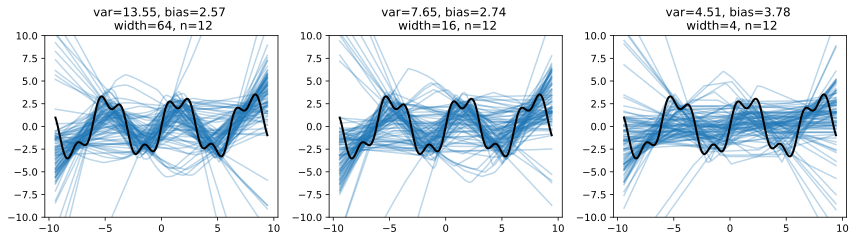

In [19]:
def reset_seed():
    np.random.seed(0)
    torch.manual_seed(0)

def plot_model(ax, width=6, sample_size=6, alpha=0.0, count=300):
    sample_preds = []
    for i in range(count):
        p = model(width, sample_size, alpha)
        if i < 100:
            ax.plot(x, p, alpha=0.3, color='C0')
        sample_preds.append(p)
    
    var = variance(sample_preds)
    b = bias(sample_preds)

    title = f"var={var:.2f}, bias={b:.2f} \n width={width}, n={sample_size}"
    if alpha > 0:
        title += f", $\lambda$={alpha:.0e}"
    
    ax.set_title(title)
    ax.plot(x, y, color="black", linewidth=2)
    ax.set_ylim(-10, 10)
    

reset_seed()
fig, ax = plt.subplots(1, 3, figsize=(12, 3.5))
plot_model(ax[0], width=64, sample_size=12)
plot_model(ax[1], width=16, sample_size=12)
plot_model(ax[2], width=4,  sample_size=12)
fig.tight_layout()

Regularization decreases variance and increases bias:

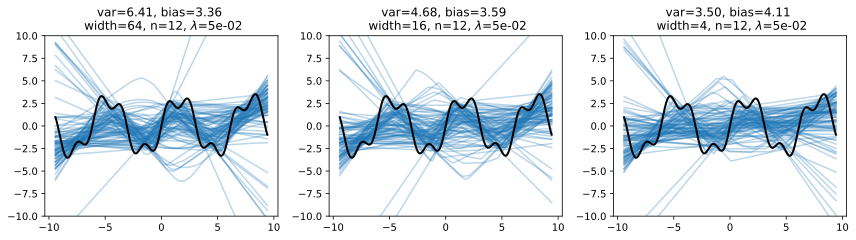

In [20]:
reset_seed()
fig, ax = plt.subplots(1, 3, figsize=(12, 3.5))
plot_model(ax[0], width=64, sample_size=12, alpha=0.05)
plot_model(ax[1], width=16, sample_size=12, alpha=0.05)
plot_model(ax[2], width=4,  sample_size=12, alpha=0.05)
fig.tight_layout()

More data decreases variance and bias dominates:

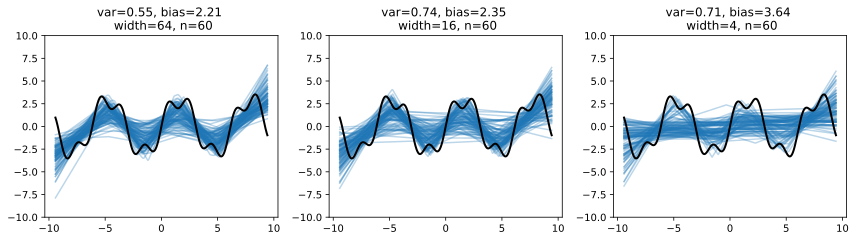

In [21]:
reset_seed()
fig, ax = plt.subplots(1, 3, figsize=(12, 3.5))
plot_model(ax[0], width=64, sample_size=60)
plot_model(ax[1], width=16, sample_size=60)
plot_model(ax[2], width=4,  sample_size=60)
fig.tight_layout()

Regularization when too strong can make low complexity models underfit:

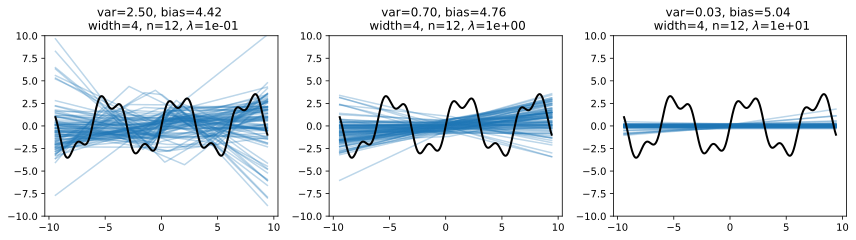

In [22]:
reset_seed()
fig, ax = plt.subplots(1, 3, figsize=(12, 3.5))
plot_model(ax[0], width=4, sample_size=12, alpha=0.1)
plot_model(ax[1], width=4, sample_size=12, alpha=1.0)
plot_model(ax[2], width=4, sample_size=12, alpha=10.0)
fig.tight_layout()

**Remark.** Notice that complex models benefit more with regularization and scale better with data compared to simple models. The experiments show that starting with complex models followed by regularization is a valid approach.

### Train-validation split

How do we know if we are overfitting or underfitting? Note that we do not have access to the
ground truth function $f$ (otherwise there is no point in doing ML) or the expected model
$\bar{f}$ (too expensive to estimate). How do we select algorithm or hyperparameters? 
This
can be done simply by reserving a subset of the dataset called the **validation set** for
estimating the true risk. The validation performance is used for choosing hyperparameters and tweaking the model class. Recall that the training dataset is used to minimize the empirical risk.

* Overfitting is characterized by significant $\mathcal{L}_{\mathcal{D}_{\text{train}}}(\boldsymbol{\Theta}) \ll \mathcal{L}_{\mathcal{D}_{\text{val}}}(\boldsymbol{\Theta})$. 
* Underfitting is characterized by $\mathcal{L}_{\mathcal{D}_{\text{train}}}(\boldsymbol{\Theta})$ not decreasing low enough ({numref}`01-train-valid-curve`).

Regularization tends to flatten out the classical U-shape validation curve that occurs before epoch-wise double descent ({numref}`01-double-descent-epochs`) where the model overfits. Assuming model complexity is not an issue, underfitting can indicate a problem with the optimizer (e.g. learning rate). We will see in the next chapter that training loss curves stuck to values away from zero may indicate a problem with the optimizer (stuck in a plateau, or bad local optima) ({numref}`01-train-valid-curve`).

Finally, another separate **test set** is used to report the final performance. The loss 
on the test set acts as a final estimate of the true risk of the trained model. Note that the training, validation, and test sets are disjoint.

<br>

```{figure} ../../img/nn/01-train-valid-curve.png
---
name: 01-train-valid-curve
width: 70%
---
Train and validation loss curves during training. Gap in train curve can indicate bias
or a problem with the optimizer.
Source: [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf)
```

```{figure} ../../img/nn/01-canonical-loss.png
---
name: 01-canonical-loss
width: 85%
---
Canonical train-validation loss curves. Source: {cite}`keras2`
```

**Remark.** A commonly used technique is **early stopping** which stops training once the validation curves stops improving after a set number of steps. One consequence of epoch-wise double descent is that early stopping only helps in the relatively narrow parameter regime of critically parameterized models ({numref}`01-double-descent-epochs`)! In fact, practical experience shows that early stopping results in overfitting the validation set ({numref}`01-early-stopping-bad`).

<br>

```{figure} ../../img/nn/01-early-stopping-bad.png
---
name: 01-early-stopping-bad
width: 100%
---
Top Kaggle GMs recommending against the use of early stopping. Source: [[video]](https://www.youtube.com/watch?v=NCGkBseUSdM)
```

---

■